Install required packages

In [1]:
%%capture
import os

packages_installed_flag = ".pip_packages_installed"

if not os.path.exists(packages_installed_flag):
    # for index-tts
    %pip install torch==2.7.0+cu128 torchaudio==2.7.0+cu128 -f https://mirrors.aliyun.com/pytorch-wheels/cu128
    %pip install transformers datasets einops sentencepiece omegaconf numpy soundfile librosa
    # for notebook
    %pip install tqdm pandas matplotlib scikit-learn
    # for download dataset and model
    %pip install huggingface_hub modelscope 
    with open(packages_installed_flag, "w") as f:
        f.write("Dependencies installed.\n")

# Note: you may need to restart the kernel to use updated packages.

In [2]:
import torch

print("torch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("CUDA version:", torch.version.cuda)
    print("cudnn version:", torch.backends.cudnn.version())
    print("Number of GPUs:", torch.cuda.device_count())
    print("Current GPU Name:", torch.cuda.get_device_name(torch.cuda.current_device()))
    print(f"Total Memory: {torch.cuda.get_device_properties(0).total_memory / (1024**2):.2f} MiB")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

torch version: 2.7.0+cu128
CUDA available: True
CUDA version: 12.8
cudnn version: 90701
Number of GPUs: 1
Current GPU Name: NVIDIA GeForce RTX 4070
Total Memory: 12281.38 MiB


In [3]:
import os 
import sys
if not os.path.exists("index-tts"):
    print("Cloning index-tts repository...")
    # Use my fork with the update-transformer branch
    # This branch support the latest `transformers` library
    # You can change the upstream repository if needed: https://github.com/index-tts/index-tts
    !git clone https://github.com/yrom/index-tts.git -b update-transformer

sys.path.append("index-tts")
from indextts.gpt.model import UnifiedVoice
print(UnifiedVoice)

<class 'indextts.gpt.model.UnifiedVoice'>


Overwrite cache directory for huggingface and modelscope.

In [4]:
import os

cache_dir = os.path.abspath(".cache")
if not os.path.exists(cache_dir):
    os.makedirs(cache_dir)
model_scope_cache_dir = os.path.join(cache_dir, "modelscope", "hub")
if not os.path.exists(model_scope_cache_dir):
    os.makedirs(model_scope_cache_dir)
hf_hub_cache_dir = os.path.join(cache_dir, "huggingface", "hub")
if not os.path.exists(hf_hub_cache_dir):
    os.makedirs(hf_hub_cache_dir)
os.environ["MODELSCOPE_CACHE"] = model_scope_cache_dir
os.environ["HF_HUB_CACHE"] = hf_hub_cache_dir
print(f"Cache directory set to: {cache_dir}")
os.listdir(cache_dir)


Cache directory set to: D:\jupyter-lab\.cache


['huggingface', 'modelscope']

Now we are ready to fine-tune the pretrained **UnifiedVoice** (base on GPT2) of Index-TTS on the speech-text dataset with emotion tags.

In [5]:
import os
from omegaconf import OmegaConf
finetune_model_dir = "finetune_models"

new_config_path = os.path.join(finetune_model_dir, "config.yaml")
if not os.path.exists(new_config_path):
    # preprocessed config file is not found!
    raise FileNotFoundError(f"Configuration file not found at {new_config_path}.")
config = OmegaConf.load(new_config_path)
print("New configuration loaded:")
print(OmegaConf.to_yaml(config))

save_checkpoint_dir = os.path.join(finetune_model_dir, "checkpoints")
if not os.path.exists(save_checkpoint_dir):
    os.makedirs(save_checkpoint_dir)
print(f"Checkpoints will be saved to: {save_checkpoint_dir}")


New configuration loaded:
dataset:
  bpe_model: bpe_new.model
  sample_rate: 24000
  squeeze: false
  mel:
    sample_rate: 24000
    n_fft: 1024
    hop_length: 256
    win_length: 1024
    n_mels: 100
    mel_fmin: 0
    normalize: false
  additional_special_tokens:
    <LAUGHS>: 12000
    <GIGGLES>: 12001
    <SIGHS>: 12002
    <CHUCKLES>: 12003
gpt:
  model_dim: 1280
  max_mel_tokens: 800
  max_text_tokens: 600
  heads: 20
  use_mel_codes_as_input: true
  mel_length_compression: 1024
  layers: 24
  number_text_tokens: 12004
  number_mel_codes: 8194
  start_mel_token: 8192
  stop_mel_token: 8193
  start_text_token: 0
  stop_text_token: 1
  train_solo_embeddings: false
  condition_type: conformer_perceiver
  condition_module:
    output_size: 512
    linear_units: 2048
    attention_heads: 8
    num_blocks: 6
    input_layer: conv2d2
    perceiver_mult: 2
vqvae:
  channels: 100
  num_tokens: 8192
  hidden_dim: 512
  num_resnet_blocks: 3
  codebook_dim: 512
  num_layers: 2
  positiona

In [6]:
import sentencepiece as spm

new_bpe_model_path = os.path.join(finetune_model_dir, config.dataset.bpe_model)
new_bpe_model = spm.SentencePieceProcessor(new_bpe_model_path)
print("New BPE model loaded successfully.")

New BPE model loaded successfully.


Finetune GPT2 with processed mel dataset

In [7]:
# reload the processed dataset if restarted kernel
from datasets import load_from_disk

if 'processed_ds' not in globals():
    print("Loading processed dataset from disk...")
    processed_ds_dir = os.path.join(finetune_model_dir, "processed_dataset")
    if os.path.exists(processed_ds_dir):
        processed_ds = load_from_disk(processed_ds_dir)
        print("Processed dataset loaded successfully. length:", len(processed_ds))

Loading processed dataset from disk...
Processed dataset loaded successfully. length: 1118


数据量太小，增强数据集（交叉匹配）
- 为m个需要增强的情绪标签的参考音频匹配 n 个其他具有相同情绪标注的文本
- 为没有情绪标注的音频匹配 m × n 个需要增强的情绪标签的文本
（`m`=需要增强的情绪标签数量）

Enhanced Dataset (Cross-Matching)  
- For each of the `m` emotion tags to be augmented, match `n` other texts with the same emotion label to the reference audio.  
- For audio samples without emotion tags, match `m × n` texts with the emotion tags to be augmented.  
(`m` = number of emotion tags to be augmented)

In [8]:
# augment dataset
from typing import List, Optional, Tuple
import torch
import copy
import random
from tqdm import tqdm
from collections import defaultdict
from datasets import Dataset


class AugmentMelDataset(torch.utils.data.IterableDataset):
    r"""Subset for augmenting mel spectrograms with emotion tags."""

    augmented_pairs: List[Tuple[int, Optional[int]]]

    def __init__(self, dataset: Dataset, augmented_pairs: List[Tuple[int, Optional[int]]]):
        self.dataset = dataset
        self.augmented_pairs = augmented_pairs

    def __len__(self):
        return len(self.augmented_pairs)

    def __getitem__(self, idx):
        idx1, idx2 = self.augmented_pairs[idx]
        if idx2 is None:
            # use the orginal sample
            return self.dataset[idx1]
        ref, target = self.dataset[idx1], self.dataset[idx2]
        # ref audio (mel spec) + target text -> target mel codes
        return {
            "audio": ref["audio"],
            "mel": ref["mel"],
            "codes": target["codes"],
            "text": target["text"],
            "text_ids": target["text_ids"],
        }

    def __getitems__(self, indices):
        return [self.__getitem__(i) for i in indices]

    def __iter__(self):
        return (self.__getitem__(i) for i in range(len(self.augmented_pairs)))



def create_augment_mel_datasets(
    dataset: Dataset,
    max_new_pairs=2,
    emotion_tag_ids=[],
    augment_emotion_tag_ids=None,
    seed=333,
):
    random.seed(seed)
    emotion_samples = defaultdict(list)

    def find_emotion_tag(text_ids):
        """Match emotion tags in text_ids."""
        for tag_id in emotion_tag_ids:
            if tag_id in text_ids:
                return tag_id
        return -1

    # group samples by emotion tags
    with tqdm(desc="Grouping samples", total=len(dataset), unit="samples") as pbar:
        for idx in range(len(dataset)):
            pbar.update(1)
            sample = dataset[idx]
            text_ids = sample["text_ids"]
            emotion_tag_id = find_emotion_tag(text_ids)
            emotion_samples[emotion_tag_id].append(idx)

    non_emotion_samples = emotion_samples.pop(-1, [])
    if not augment_emotion_tag_ids:
        augment_emotion_samples = list(emotion_samples.values())
    else:
        augment_emotion_samples = [
            emotion_samples[tag_id]
            for tag_id in augment_emotion_tag_ids
            if tag_id in emotion_samples and len(emotion_samples[tag_id]) > 0
        ]
    augment_emotion_pairs: List[Tuple[int, int]] = []
    validation_pairs: List[Tuple[int, int]] = []
    test_pairs: List[Tuple[int, int]] = []
    for sample_indices in augment_emotion_samples:
        if len(sample_indices) == 1:
            augment_emotion_pairs.append((sample_indices[0], None))
            continue
        for idx in sample_indices:
            sample = dataset[idx]
            if sample["mel"].shape[1] < 200:
                # skip too short audio samples
                continue
            # self-pairing
            augment_emotion_pairs.append((idx, None))
            other_indices = [i for i in sample_indices if i != idx]
            if len(other_indices) == 0:
                continue
            augment_ids = random.sample(other_indices, min(max_new_pairs, len(other_indices)))
            if len(augment_ids) == len(other_indices):
                validation_ids = []
            else:
                # randomly select validation pairs from other indices
                # that are not in augment_ids
                validation_ids = [i for i in other_indices if i not in augment_ids]
                validation_ids = random.sample(validation_ids, min(max_new_pairs, len(other_indices)))
            for other_idx in augment_ids:
                # ref audio (with same emotion tag) + emotion tagged text -> emotion audio mel codes
                augment_emotion_pairs.append((idx, other_idx))
            for other_idx in validation_ids:
                validation_pairs.append((idx, other_idx))
            # make test pairs
            if len(other_indices) - len(augment_ids) - len(validation_ids) > 0:
                remaining_indices = [i for i in other_indices if i not in augment_ids and i not in validation_ids]
                remaining_indices = random.sample(remaining_indices, min(max_new_pairs, len(remaining_indices)))
                for other_idx in remaining_indices:
                    test_pairs.append((idx, other_idx))
    if len(non_emotion_samples) > 0:
        for idx in non_emotion_samples:
            sample = dataset[idx]
            if sample["mel"].shape[1] < 250:
                continue
            for sample_indices in augment_emotion_samples:
                if len(sample_indices) == 1:
                    augment_emotion_pairs.append((idx, sample_indices[0]))
                    continue
                augment_ids = random.sample(other_indices, min(max_new_pairs, len(sample_indices)))
                if len(augment_ids) == len(other_indices):
                    validation_ids = []
                else:
                    validation_ids = [i for i in other_indices if i not in augment_ids]
                    validation_ids = random.sample(validation_ids, min(max_new_pairs, len(validation_ids)))
                for other_idx in augment_ids:
                    # ref audio (non-emotion) + emotion tagged text -> emotion audio mel codes
                    augment_emotion_pairs.append((idx, other_idx))
                for other_idx in validation_ids:
                    validation_pairs.append((idx, other_idx))
                if len(other_indices) - len(augment_ids) - len(validation_ids) > 0:
                    remaining_indices = [i for i in other_indices if i not in augment_ids and i not in validation_ids]
                    remaining_indices = random.sample(remaining_indices, min(max_new_pairs, len(remaining_indices)))
                    for other_idx in remaining_indices:
                        test_pairs.append((idx, other_idx))
    random.shuffle(augment_emotion_pairs)
    # create augmented dataset
    aument_ds = AugmentMelDataset(dataset, augment_emotion_pairs)
    # create validation dataset
    validation_ds = AugmentMelDataset(
        dataset, random.sample(validation_pairs, min(len(augment_emotion_pairs) // 6, len(validation_pairs)))
    )
    # create test dataset
    test_ds = AugmentMelDataset(dataset, random.sample(test_pairs, min(10, len(test_pairs))))
    return aument_ds, validation_ds, test_ds


In [9]:
processed_ds.set_format(
    type="torch",
    output_all_columns=True,
)
emotion_tag_ids = list(config.dataset.additional_special_tokens.values())
# select one or more emotion tags to augment mel dataset
augment_emotion_tag_ids = [
    config.dataset.additional_special_tokens["<GIGGLES>"],
    # config.dataset.additional_special_tokens["<LAUGHS>"],
]
train_augment_ds, valid_ds, test_ds = create_augment_mel_datasets(
    processed_ds,
    max_new_pairs=2,
    emotion_tag_ids=emotion_tag_ids,
    augment_emotion_tag_ids=augment_emotion_tag_ids,
    seed=233,
)
print(f"Augmented mel dataset size: {len(train_augment_ds)}, for target emotion tags: {augment_emotion_tag_ids}")
print(f"Validation dataset size: {len(valid_ds)}")
print(f"Test dataset size: {len(test_ds)}")

Grouping samples: 100%|██████████████████████████████████████████████████████| 1118/1118 [00:03<00:00, 347.86samples/s]


Augmented mel dataset size: 1762, for target emotion tags: [12001]
Validation dataset size: 293
Test dataset size: 10


In [10]:
from indextts.gpt.model import UnifiedVoice

def load_UnifiedVoice(gpt_config, gpt_checkpoint_path, device=None):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    state_dict = torch.load(gpt_checkpoint_path, map_location=device, weights_only=True)
    state_dict = state_dict["model"] if "model" in state_dict else state_dict
    model = UnifiedVoice(**gpt_config)
    model.load_state_dict(state_dict, strict=True)
    model.post_init_gpt2_config()
    del state_dict
    return model.to(device)
def clear_torch_cache(device):
    import gc
    gc.collect()
    if device.type == "cuda":
        # clear CUDA cache to avoid memory issues
        print("Clearing CUDA cache...")
        print(torch.cuda.memory_reserved(device) / (1024**2), "MiB reserved")
        torch.cuda.synchronize(device)
        torch.cuda.empty_cache()
        print("CUDA cache cleared.")
        print(torch.cuda.memory_reserved(device) / (1024**2), "MiB reserved")

In [11]:
# load vocoder model (bigvgan)
from indextts.BigVGAN.models import BigVGAN
bigvgan_checkpoint_path = os.path.join(finetune_model_dir, config.bigvgan_checkpoint)
bigvgan = BigVGAN(config.bigvgan)
bigvgan_state_dict = torch.load(bigvgan_checkpoint_path, map_location="cpu", weights_only=True)["generator"]
bigvgan.load_state_dict(bigvgan_state_dict, strict=True)
bigvgan.remove_weight_norm()
bigvgan.eval()
bigvgan.to(device)
print("BigVGAN (Generator) model loaded successfully.")
del bigvgan_state_dict

D:\jupyter-lab\.venv\Lib\site-packages\torch\nn\utils\weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


Removing weight norm...
BigVGAN (Generator) model loaded successfully.


In [12]:
# load the UnifiedVoice model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
gpt_checkpoint_path = os.path.join(finetune_model_dir, config.gpt_checkpoint)
if 'model' in globals():
    del model  # clear previous model if exists
    clear_torch_cache(device)
model = load_UnifiedVoice(config.gpt, gpt_checkpoint_path, device=device)
print("UnifiedVoice model loaded successfully.")

D:\jupyter-lab\.venv\Lib\site-packages\transformers\configuration_utils.py:312: UserWarning: Passing `gradient_checkpointing` to a config initialization is deprecated and will be removed in v5 Transformers. Using `model.gradient_checkpointing_enable()` instead, or if you are using the `Trainer` API, pass `gradient_checkpointing=True` in your `TrainingArguments`.
  warnings.warn(


UnifiedVoice model loaded successfully.


Inference waveform

In [13]:
# inference codes and generate audio
import torch.nn.functional as F


def eval_mode(func):
    def wrapper(model, *args, **kwargs):
        model.eval()
        model.inference_model.kv_cache = True
        with torch.inference_mode():
            function_result = func(model, *args, **kwargs)
        model.train()
        model.inference_model.kv_cache = False
        return function_result

    return wrapper


def remove_long_silence(codes: torch.Tensor, stop_mel_token=8193, silent_tokens=[52], max_consecutive=30):
    """
    Shrink special tokens (silent_token and stop_mel_token) in codes
    codes: [B, T]
    """
    code_lens = []
    codes_list = []
    device = codes.device
    silent_tokens = torch.tensor(silent_tokens, dtype=torch.long, device=device)
    isfix = False
    for i in range(0, codes.shape[0]):
        code = codes[i]
        if not torch.any(code == stop_mel_token).item():
            len_ = code.size(0)
        else:
            stop_mel_idx = (code == stop_mel_token).nonzero(as_tuple=False)
            len_ = stop_mel_idx[0].item() if len(stop_mel_idx) > 0 else code.size(0)

        count = torch.sum(torch.isin(code, silent_tokens).int()).item()
        if count > max_consecutive:
            # code = code.cpu().tolist()
            ncode_idx = []
            n = 0
            for k in range(len_):
                assert code[k] != stop_mel_token, f"stop_mel_token {stop_mel_token} should be shrinked here"
                is_slience = torch.isin(code[k], silent_tokens).any()
                if ~is_slience:
                    ncode_idx.append(k)
                    n = 0
                elif is_slience.item() and n < 10:
                    ncode_idx.append(k)
                    n += 1
                # if (k == 0 and code[k] == 52) or (code[k] == 52 and code[k-1] == 52):
                #    n += 1
            # new code
            len_ = len(ncode_idx)
            codes_list.append(code[ncode_idx])
            isfix = True
        else:
            # shrink to len_
            codes_list.append(code[:len_])
        code_lens.append(len_)
    if isfix:
        if len(codes_list) > 1:
            codes = torch.nn.utils.rnn.pad_sequence(codes_list, batch_first=True, padding_value=stop_mel_token)
        else:
            codes = codes_list[0].unsqueeze(0)
    else:
        # unchanged
        pass
    # clip codes to max length
    max_len = max(code_lens)
    if max_len < codes.shape[1]:
        codes = codes[:, :max_len]
    code_lens = torch.tensor(code_lens, dtype=torch.long, device=device)
    return codes, code_lens


@torch.no_grad()
def infer_waveform(
    model: UnifiedVoice,
    bigvgan: BigVGAN,
    cond_mel: torch.Tensor,
    cond_mel_lengths: torch.Tensor,
    text_inputs: torch.Tensor,
    text_lengths: torch.Tensor,
    mel_codes: torch.Tensor,
    codes_lengths: torch.Tensor,
):
    if cond_mel.ndim == 2:
        cond_mel = cond_mel.unsqueeze(0)
    latent = model(
        cond_mel,
        text_inputs=text_inputs,
        text_lengths=text_lengths,
        cond_mel_lengths=cond_mel_lengths,
        mel_codes=mel_codes,
        wav_lengths=codes_lengths * model.mel_length_compression,
        return_latent=True,
        clip_inputs=False,
    )
    # generate audio from latent codes
    waveform, _ = bigvgan(latent, mel_ref=cond_mel, lens=cond_mel_lengths)
    waveform = waveform.squeeze(1)
    waveform = torch.clamp(32767 * waveform, -32767.0, 32767.0).to(dtype=torch.int16, device="cpu")
    return waveform


@torch.no_grad()
def infer_melcodes(
    model: UnifiedVoice,
    cond_mel: torch.FloatTensor,
    text_inputs: torch.Tensor,
    cond_mel_lengths: torch.Tensor,
    do_sample=True,
    temperature=1.0,
    top_p=0.8,
    top_k=20,
    num_beams=3,
    repetition_penalty=10.0,
):
    # test_codes = torch.tensor(test_data["codes"], dtype=torch.long, device=device).unsqueeze(0)
    mel_codes = model.inference_speech(
        cond_mel,
        text_inputs=text_inputs,
        cond_mel_lengths=cond_mel_lengths,
        do_sample=do_sample,
        temperature=temperature,
        top_p=top_p,
        top_k=top_k,
        num_beams=num_beams,
        repetition_penalty=repetition_penalty,
        use_cache=True,
    )
    # print(mel_codes)
    mel_codes, codes_lengths = remove_long_silence(mel_codes, stop_mel_token=model.stop_mel_token, silent_tokens=[52,428], max_consecutive=10)
    return mel_codes, codes_lengths


@eval_mode
def generate_audio(
    model: UnifiedVoice,
    bigvgan: BigVGAN,
    text_inputs: list[int] | torch.Tensor,
    cond_mel: torch.Tensor,
    sample_rate=24_000,
    device=None,
    output_path=None,
):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    if torch.is_tensor(text_inputs):
        text_inputs = text_inputs.to(device=device)
    elif isinstance(text_inputs, list) and isinstance(text_inputs[0], int):
        text_inputs = torch.tensor(text_inputs, device=device)
    else:
        raise ValueError("text_inputs must be a list of integers or a torch.Tensor of integers.")
    if text_inputs.ndim == 1:
        text_inputs = text_inputs.unsqueeze(0)
    text_lengths = torch.tensor([text_inputs.shape[-1]], device=device)
    cond_mel = cond_mel.to(device=device, dtype=torch.float32)
    if cond_mel.ndim == 2:
        cond_mel = cond_mel.unsqueeze(0)
    cond_mel_lengths = torch.tensor([cond_mel.shape[-1]], device=device)
    gen_mel_codes, codes_length = infer_melcodes(
        model,
        cond_mel=cond_mel,
        text_inputs=text_inputs,
        cond_mel_lengths=cond_mel_lengths,
    )
    waveform = infer_waveform(
        model,
        bigvgan,
        cond_mel=cond_mel,
        cond_mel_lengths=cond_mel_lengths,
        text_inputs=text_inputs,
        text_lengths=text_lengths,
        mel_codes=gen_mel_codes,
        codes_lengths=codes_length,
    )
    if output_path is not None:
        import torchaudio

        torchaudio.save(output_path, waveform, sample_rate)
    return waveform


Test before finetuning

In [14]:
from IPython.display import Audio, display

def test_synthetic_speech(
    model, bpe, bigvgan, sample, device=torch.device("cpu"), test_tag="<GIGGLES>", display_condition=True
):
    from indextts.utils.common import tokenize_by_CJK_char

    text_inputs = [
        "Hey there my name is Elise, {} and I'm a speech generation model that can sound like a person.",
        tokenize_by_CJK_char("你好, 我是 Elise, 一个语音生成模型, {} 我的声音听起来跟真人一样."),
    ]
    if display_condition:
        # print("Test condition text:", sample["text"])
        condition_audio = sample["audio"]["array"]
        sampling_rate = 24000
        print(f"Conditional Audio length: {condition_audio.shape[-1] / sampling_rate:.2f}seconds")
        display(Audio(condition_audio, rate=sampling_rate))
    cond_mel = torch.tensor(sample["mel"]) if not torch.is_tensor(sample["mel"]) else sample["mel"]
    for text in text_inputs:
        text = text.format((test_tag if test_tag is not None else ""))
        print(f"Text: {text}")
        text_ids = torch.tensor(bpe.EncodeAsIds(text.upper()), device=device, dtype=torch.int32)
        gen_waveform = generate_audio(model, bigvgan, text_ids, cond_mel=cond_mel, device=device)
        # print(f"Generated audio waveform length: {gen_waveform.shape[-1] / 24000:.2f}seconds")
        display(Audio(gen_waveform.numpy(), rate=24000))
        print("-" * 20)
        del text, text_ids, gen_waveform
    if device.type == "cuda":
        torch.cuda.empty_cache()

In [15]:
selected_emotion_tag = config.dataset.additional_special_tokens['<GIGGLES>'] # 12001
selected_emotion_tag = torch.tensor(selected_emotion_tag)
test_conditions = (
    processed_ds.with_format("torch", output_all_columns=True)
    .shuffle(seed=66)
    .filter(lambda sample: selected_emotion_tag in sample["text_ids"])
    .take(1)
)
test_condition = test_conditions[0]
test_synthetic_speech(model, new_bpe_model, bigvgan, test_condition, device, test_tag='<GIGGLES>')

Conditional Audio length: 5.90seconds


Text: Hey there my name is Elise, <GIGGLES> and I'm a speech generation model that can sound like a person.


--------------------
Text: 你 好 , 我 是 ELISE, 一 个 语 音 生 成 模 型 , <GIGGLES> 我 的 声 音 听 起 来 跟 真 人 一 样 .


--------------------


In [16]:
# @title show augment dataset sample
sample = test_ds[0]
print("Sample Audio:")
display(Audio(sample["audio"]["array"], rate=sample["audio"]["sampling_rate"].item()))
print(f"Target Text: {sample['text']}")
model.eval()
gen_waveform = infer_waveform(
    model,
    bigvgan,
    sample["mel"].to(device=device, dtype=torch.float32).unsqueeze(0),
    torch.tensor([sample["mel"].shape[-1]], dtype=torch.long, device=device),
    text_inputs=sample["text_ids"].to(device=device).unsqueeze(0),
    text_lengths=torch.tensor([sample["text_ids"].shape[-1]], dtype=torch.long, device=device),
    mel_codes=sample["codes"].to(device=device).unsqueeze(0),
    codes_lengths=torch.tensor([sample["codes"].shape[-1]], dtype=torch.long, device=device),
)
print(f"Generated audio waveform length: {gen_waveform.shape[-1] / 24000:.2f}seconds")
display(Audio(gen_waveform, rate=24000))
print("-" * 40)
del sample, gen_waveform

Sample Audio:


Target Text: ...AREN'T YOU? <GIGGLES> I LOVE YOU TOO, BUT IF I KNEW WEARING YOUR COOKING APRON WAS GOING TO GET THIS KIND-
Generated audio waveform length: 5.93seconds


----------------------------------------


Define the training function.


In [17]:
import torch.nn.functional as F
import torch


def as_torch_tensor(sample, device):
    # map the processed dataset to torch tensors
    mel = (
        torch.tensor(sample["mel"], device=device, dtype=torch.float32)
        if not torch.is_tensor(sample["mel"])
        else sample["mel"].to(device)
    )
    if mel.ndim == 2:
        mel = mel.unsqueeze(0)  # add batch dimension
    mel_codes = (
        torch.tensor(sample["codes"], device=device, dtype=torch.long)
        if not torch.is_tensor(sample["codes"])
        else sample["codes"].to(device)
    )
    if mel_codes.ndim == 1:
        mel_codes = mel_codes.unsqueeze(0)
    text_ids = (
        torch.tensor(sample["text_ids"], device=device, dtype=torch.long)
        if not torch.is_tensor(sample["text_ids"])
        else sample["text_ids"].to(device)
    )
    if text_ids.ndim == 1:
        text_ids = text_ids.unsqueeze(0)

    return mel, mel_codes, text_ids


def as_torch_tensors(samples, device):
    mels = []
    mel_codes = []
    text_ids = []
    if isinstance(samples, dict):
        for m in samples["mel"]:
            mel = torch.tensor(m, device=device, dtype=torch.float32) if not torch.is_tensor(m) else m.to(device)
            if mel.ndim == 2:
                mel = mel.unsqueeze(0)
            mels.append(mel)
        for c in samples["codes"]:
            mel_code = torch.tensor(c, device=device, dtype=torch.long) if not torch.is_tensor(c) else c.to(device)
            if mel_code.ndim == 1:
                mel_code = mel_code.unsqueeze(0)
            mel_codes.append(mel_code)
        for t in samples["text_ids"]:
            text_id = torch.tensor(t, device=device, dtype=torch.long) if not torch.is_tensor(t) else t.to(device)
            if text_id.ndim == 1:
                text_id = text_id.unsqueeze(0)
            text_ids.append(text_id)
    elif isinstance(samples, list):
        for s in samples:
            mel, mel_code, text_id = as_torch_tensor(s, device=device)
            mels.append(mel)
            mel_codes.append(mel_code)
            text_ids.append(text_id)
    return mels, mel_codes, text_ids


def forward_gpt2(
    model: UnifiedVoice,
    inputs_embeds: torch.FloatTensor,
    text_lengths: torch.LongTensor,
    codes_lengths: torch.LongTensor,
    attention_mask: Optional[torch.Tensor] = None,
    output_latent: bool = False,
    output_logits: bool = True,
):
    r"""
    Forward pass for the GPT2Model of UnifiedVoice.
    """
    b = inputs_embeds.shape[0]
    gpt_out = model.gpt(inputs_embeds=inputs_embeds, attention_mask=attention_mask, return_dict=True)
    hidden_state = gpt_out.last_hidden_state

    outputs = []
    for i in range(b):
        text_len = text_lengths[i].item()
        mel_codes_len = codes_lengths[i].item()
        offset = inputs_embeds.shape[1] - text_len - mel_codes_len
        h = hidden_state[i, offset:].unsqueeze(0)  # (1, T+S, D)
        latent = model.final_norm(h)
        text_latent, mel_latent = latent[:, :text_len], latent[:, -mel_codes_len:]
        text_logits = model.text_head(text_latent)
        mel_logits = model.mel_head(mel_latent)
        text_logits = text_logits.permute(0, 2, 1)
        mel_logits = mel_logits.permute(0, 2, 1)
        output = {}
        if output_logits:
            output["logits"] = (text_logits, mel_logits)
        if output_latent:
            output["latent"] = (text_latent, mel_latent)
        outputs.append(output)
    if b == 1:
        return outputs[0]
    return outputs


def forward_UnifiedVoice(
    model: UnifiedVoice,
    mel_spec: torch.FloatTensor,
    mel_codes: torch.LongTensor,
    text_ids: torch.LongTensor,
    add_mel_stop_token=True,
    output_loss=True,
    output_logits=True,
    output_latent=False,
    loss_reduction="mean",
    device=None,
):
    """Forward pass for UnifiedVoice model.
    mel_spec: (1, 100, T)
    mel_codes: (1, s)
    text_ids: (1, t)
    """
    if device is None:
        device = model.final_norm.weight.device
    mel_spec = mel_spec.to(device)
    mel_codes = mel_codes.to(device)
    text_ids = text_ids.to(device=device)
    cond_mel_lengths = torch.tensor([mel_spec.shape[-1]], device=device)
    conditioning_latent = model.get_conditioning(mel_spec, cond_mel_lengths)
    text_inputs = F.pad(text_ids, (1, 1), value=model.start_text_token)
    text_inputs[:, -1] = model.stop_text_token
    # shift labels
    text_targets = text_inputs[:, 1:].clone().contiguous()
    mel_codes = F.pad(mel_codes, (1, 0), value=model.start_mel_token)
    if add_mel_stop_token:
        mel_codes = F.pad(mel_codes, (0, 1), value=model.stop_mel_token)
    mel_targets = mel_codes[:, 1:].clone().contiguous()

    text_emb = model.text_embedding(text_inputs) + model.text_pos_embedding(text_inputs)
    mel_emb = model.mel_embedding(mel_codes) + model.mel_pos_embedding(mel_codes)
    inputs_embeds = torch.cat([conditioning_latent, text_emb, mel_emb], dim=1)
    gpt2_outputs = forward_gpt2(
        model,
        inputs_embeds,
        torch.tensor([text_inputs.shape[-1]], device=device),
        torch.tensor([mel_codes.shape[-1]], device=device),
        attention_mask=None,
        output_latent=output_latent,
        output_logits=output_logits or output_loss,
    )
    assert isinstance(gpt2_outputs, dict), "gpt2_outputs should be a dict"

    outputs = {}
    if output_logits or output_loss:
        text_logits, mel_logits = gpt2_outputs["logits"]
        # shift logits, n tokens predict n+1
        text_logits = text_logits[:, :, :-1].contiguous()
        mel_logits = mel_logits[:, :, :-1].contiguous()
        if output_loss:
            loss_text = F.cross_entropy(text_logits, text_targets.long(), reduction=loss_reduction)
            loss_mel = F.cross_entropy(mel_logits, mel_targets.long(), reduction=loss_reduction)
            outputs["loss"] = (loss_text, loss_mel)
        if output_logits:
            outputs["logits"] = (text_logits, mel_logits)
            outputs["targets"] = (text_targets, mel_targets)
        del text_logits, mel_logits, text_targets, mel_targets
    if output_latent:
        text_latent, mel_latent = gpt2_outputs["latent"]
        outputs["latent"] = (text_latent, mel_latent)
    del gpt2_outputs, text_emb, mel_emb, conditioning_latent, text_inputs, mel_codes
    if device.type == "cuda":
        torch.cuda.empty_cache()
    return outputs

def train_UnifiedVoice(
    model: UnifiedVoice,
    mel_spec: torch.FloatTensor,
    mel_codes: torch.LongTensor,
    text_ids: torch.LongTensor,
    output_loss=True,
    output_logits=False,
    add_mel_stop_token=True,
    loss_reduction="mean",
):
    model.train()
    model.inference_model.kv_cache = False  # disable kv cache for training
    return forward_UnifiedVoice(
        model,
        mel_spec=mel_spec,
        mel_codes=mel_codes,
        text_ids=text_ids,
        add_mel_stop_token=add_mel_stop_token,
        output_loss=output_loss,
        output_logits=output_logits,
        output_latent=False,
        loss_reduction=loss_reduction,
    )


def top_k_accuracy(logits: torch.Tensor, targets: torch.Tensor, dim=-1, k=(1, 10, 20)):
    """
    计算 top-k 准确率, logits: (B, L, dim), targets: (B, L)
     https://github.com/bearpaw/pytorch-classification/blob/cc9106d598ff1fe375cc030873ceacfea0499d77/utils/eval.py
    :param logits: 模型输出的 logits
    :param targets: 目标标签
    """
    if not isinstance(k, (list, tuple)):
        k = [k]

    ret = []
    maxk = max(k)
    _, topk_preds = torch.topk(logits, maxk, dim=dim)  # (B, T, 10)
    # targets: (B, L)
    for n in k:
        # (B, L, k)
        topk = topk_preds[..., :n]
        # (B, L): True if target in topk
        correct = (topk == targets.unsqueeze(-1)).any(dim=-1)
        acc = correct.float().mean() * 100
        ret.append(acc.item())
    return ret


def eval_UnifiedVoice(
    model: UnifiedVoice,
    mel_spec: torch.FloatTensor,
    mel_codes: torch.LongTensor,
    text_ids: torch.LongTensor,
    device: torch.device = None,
):
    if device is None:
        device = model.final_norm.weight.device
    model.eval()
    outputs = forward_UnifiedVoice(
        model,
        mel_spec=mel_spec,
        mel_codes=mel_codes,
        text_ids=text_ids,
        output_loss=True,
        output_logits=True,
        device=device,
    )
    loss_text, loss_mel = outputs["loss"]
    text_logits, mel_logits = outputs["logits"]
    text_targets, mel_targets = outputs["targets"]
    acc_1, acc_10, acc_20 = top_k_accuracy(mel_logits.permute(0, 2, 1), mel_targets, dim=-1, k=(1, 10, 20))
    del text_logits, mel_logits, text_targets, mel_targets
    if device.type == "cuda":
        torch.cuda.empty_cache()
    return loss_text, loss_mel, acc_1, acc_10, acc_20


def validate_UnifiedVoice(
    model: UnifiedVoice,
    val_ds: torch.utils.data.Dataset,
    device: torch.device = torch.device("cpu"),
    epoch: int = 0,
):
    val_results = []
    with (
        torch.no_grad(),
        tqdm(val_ds, desc=f"Validation epoch {epoch + 1}", unit="samples") as val_progress,
    ):
        model.eval()
        for val_item in val_progress:
            val_outputs = eval_UnifiedVoice(model, *as_torch_tensor(val_item, device=device), device=device)
            val_results.append(val_outputs)
            val_progress.set_postfix(
                # text=f"{val_outputs[0].item():.4f}",
                mel=f"{val_outputs[1].item():.4f}",
                # acc_1=f"{val_outputs[2]:.2f}",
                acc_10=f"{val_outputs[3]:.2f}",
                acc_20=f"{val_outputs[4]:.2f}",
            )
        clear_torch_cache(device)
        # reset model to training mode
        model.train()
    val_text_losses = [res[0].item() for res in val_results]
    val_mel_losses = [res[1].item() for res in val_results]
    val_acc_1 = [res[2] for res in val_results]
    val_acc_10 = [res[3] for res in val_results]
    val_acc_20 = [res[4] for res in val_results]
    val_loss_text = sum(val_text_losses) / len(val_text_losses)
    val_loss_mel = sum(val_mel_losses) / len(val_mel_losses)
    val_acc_1 = sum(val_acc_1) / len(val_acc_1)
    val_acc_10 = sum(val_acc_10) / len(val_acc_10)
    val_acc_20 = sum(val_acc_20) / len(val_acc_20)
    del val_results, val_text_losses, val_mel_losses
    return (val_loss_text, val_loss_mel, val_acc_1, val_acc_10, val_acc_20)

First, fine-tune the text embedding and text head layer of UnifiedVoice for the added emotion tags.

```py
model.text_embedding.requires_grad_(True)
model.text_head.requires_grad_(True)
```

In [18]:
#@title Visualize text embeddings with t-SNE
# %pip install matplotlib scikit-learn --quiet
%matplotlib inline
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np


def plot_ft_losses(text_losses, mel_losses=None, title="Fine-tuning Losses", xlabel="Steps", ylabel="Loss"):
    """Plot the fine-tuning losses."""
    plt.figure(figsize=(6, 3))
    plt.plot(text_losses, label="Text Loss", color="blue")
    if mel_losses is not None:
        plt.plot(mel_losses, label="Mel Loss", color="orange", linewidth=2)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid()
    plt.show()

def visualize_embeddings(
    text_embedding, new_token_ids, token_labels=None, sample_ids=None, title="Text embbdings", show=True
):
    """Visualize the text embeddings using t-SNE."""
    embeddings = text_embedding.weight.detach().cpu().numpy()
    # Select the embeddings for the new tokens and some random samples
    sample_indices = new_token_ids.cpu().numpy()
    if sample_ids is not None:
        sample_indices = np.concatenate((sample_indices, sample_ids))

    tsne = TSNE(n_components=2, init="random", random_state=42, perplexity=30, max_iter=1000)
    reduced = tsne.fit_transform(embeddings[sample_indices])

    plt.figure(figsize=(6, 4))

    if sample_ids is not None:
        offset = len(new_token_ids)
        new_token_idx = reduced[:offset:, :]
        scatter = plt.scatter(
            reduced[offset:, 0],
            reduced[offset:, 1],
            alpha=0.5,
            label="Original tokens",
        )
    else:
        new_token_idx = reduced
    plt.scatter(new_token_idx[:, 0], new_token_idx[:, 1], alpha=0.8, label="New tokens", c="red")
    if token_labels is not None:
        for i, (x, y) in enumerate(new_token_idx):
            plt.annotate(
                token_labels[i],
                (x, y),
                fontsize=12,
                # xytext=(5, 5),
                # textcoords="offset points",
                # bbox=dict(boxstyle="round,pad=0.3", fc="yellow", alpha=0.3),
            )
    plt.legend()
    plt.title(title)
    if not show:
        plt.savefig(f"{'_'.join(title.split())}.png")
    if show:
        plt.show()


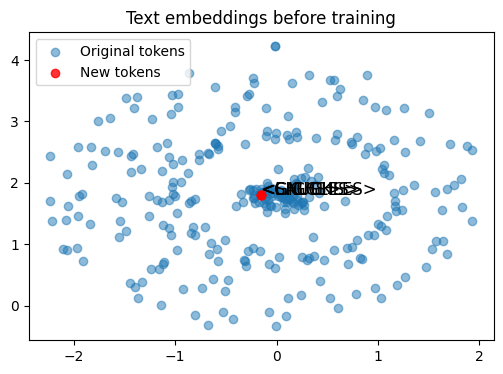

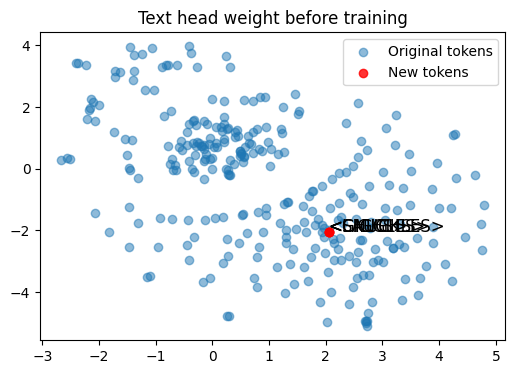

In [19]:
import functools
import numpy as np
new_token_ids = torch.tensor(
    list(config.dataset.additional_special_tokens.values()),
    device=device,
    dtype=torch.long,
)
np.random.seed(100)
sample_ids = list(np.random.randint(10, 12000, size=300))

visualize_text_embeddings = functools.partial(
    visualize_embeddings,
    new_token_ids=new_token_ids,
    token_labels=list(config.dataset.additional_special_tokens.keys()),
    sample_ids=sample_ids,
    show=True,
)
visualize_text_embeddings(
    model.text_embedding,
    title="Text embeddings before training",
)
visualize_text_embeddings(
    model.text_head,
    title="Text head weight before training",
)

Instead of fine-tuning full text embedding and head layers, we only train weights for the added emotion tags.


In [20]:
# train new text embeddings and text head
from collections import OrderedDict
from torch.optim import AdamW
from tqdm import tqdm
import torch.nn.functional as F


def log_message(message, log_file=None):
    print(message, file=log_file)


class NewTokensTrainableAdapter(torch.nn.Module):
    """Wrapper for the new tokens training"""
    merged: bool = False
    base_layer: torch.nn.Embedding | torch.nn.Linear
    new_token_ids: torch.LongTensor
    def __init__(self, base_layer: torch.nn.Embedding | torch.nn.Linear, new_token_ids: torch.Tensor):
        super().__init__()
        self.base_layer = base_layer
        self.new_token_ids = new_token_ids.long()
        self.register_parameter(
            "new_tokens_weight",
            torch.nn.Parameter(base_layer.weight.data[new_token_ids].clone().detach(), requires_grad=True),
        )
        # linear layer bias
        if isinstance(base_layer, torch.nn.Linear):
            if base_layer.bias is not None:
                self.register_parameter(
                    "new_tokens_bias",
                    torch.nn.Parameter(base_layer.bias.data[new_token_ids].clone().detach(), requires_grad=True),
                )
            else:
                self.register_parameter("new_tokens_bias", None)
        self.base_layer.requires_grad_(False)  # freeze the base layer

    def requires_grad_(self, requires_grad: bool):
        """Set the requires_grad attribute for the new tokens weights and bias."""
        self.new_tokens_weight.requires_grad_(requires_grad)
        if isinstance(self.base_layer, torch.nn.Linear) and self.new_tokens_bias is not None:
            self.new_tokens_bias.requires_grad_(requires_grad)
        return self

    def __getattr__(self, name):
        if name == "weight":
            if self.merged:
                # if merged, return the merged weight
                return self.base_layer.weight
            return self.get_merged_weight()
        return super().__getattr__(name)

    def get_merged_weight(self):
        W = self.base_layer.weight
        index = self.new_token_ids.to(W.device)
        deltas = self.new_tokens_weight.to(W)
        return W.index_copy(dim=0, index=index, source=deltas)

    def forward(self, x):
        """Forward method to replace the base layer with new tokens."""
        if self.merged:
            return self.base_layer(x)
        W = self.get_merged_weight()
        if isinstance(self.base_layer, torch.nn.Linear):
            b = self.base_layer.bias
            if b is not None:
                bias_deltas = self.new_tokens_bias.to(b)
                b = b.index_copy(dim=0, index=self.new_token_ids, source=bias_deltas)
            else:
                b = None
            return F.linear(x, weight=W, bias=b)

        return F.embedding(
            x,
            weight=W,
            padding_idx=self.base_layer.padding_idx,
            max_norm=self.base_layer.max_norm,
            norm_type=self.base_layer.norm_type,
            scale_grad_by_freq=self.base_layer.scale_grad_by_freq,
            sparse=self.base_layer.sparse,
        )

    def merge(self):
        """Merge the new tokens weights into the base layer."""
        if not self.merged:
            self.merged = True
            self.base_layer.weight.copy_(self.get_merged_weight())
            if isinstance(self.base_layer, torch.nn.Linear) and self.new_tokens_bias is not None:
                b = self.base_layer.bias
                if b is not None:
                    b.index_copy_(dim=0, index=self.new_token_ids.to(b.device), source=self.new_tokens_bias.to(b))

    def unmerge(self):
        if self.merged:
            self.merged = False


class NewTokensTrainingOptimizer:
    """Optimizer that only updates the new text embeddings and text head weights."""

    def __init__(self, model: UnifiedVoice, new_token_ids: torch.Tensor, lr=5e-5, weight_decay=0.1):
        model.requires_grad_(False)  # freeze the model parameters
        # repalce the text embedding and text head with new trainable layers
        new_token_ids = new_token_ids.long()
        if isinstance(model.text_embedding, NewTokensTrainableAdapter):
            # already wrapped, no need to wrap again
            self.text_embedding = model.text_embedding
        else:
            self.text_embedding = NewTokensTrainableAdapter(model.text_embedding, new_token_ids)
        if isinstance(model.text_head, NewTokensTrainableAdapter):
            # already wrapped, no need to wrap again
            self.text_head = model.text_head
        else:
            self.text_head = NewTokensTrainableAdapter(model.text_head, new_token_ids)
        self.text_embedding.requires_grad_(True)
        self.text_head.requires_grad_(True)
        self.optimizer = AdamW(
            [
                {
                    "params": [
                        ("text_embed.weight", self.text_embedding.new_tokens_weight),
                        ("text_head.weight", self.text_head.new_tokens_weight),
                    ],
                    "weight_decay": weight_decay,
                    "lr": lr * 4,
                },
                {
                    "params": [
                        ("text_head.bias", self.text_head.new_tokens_bias),
                    ],
                    "weight_decay": 0.0,
                    "lr": lr,
                },
            ],
        )
        model.text_embedding = self.text_embedding
        model.text_head = self.text_head
        self.model = model

    def step(self):
        self.optimizer.step()

    def zero_grad(self):
        self.optimizer.zero_grad()

    @torch.no_grad()
    def save_checkpoint(self, checkpoint_path):
        self.text_embedding.merge()
        self.text_head.merge()
        state_dict = OrderedDict()
        state_dict.update(self.text_embedding.base_layer.state_dict(prefix="text_embedding."))
        state_dict.update(self.text_head.base_layer.state_dict(prefix="text_head."))
        torch.save(state_dict, checkpoint_path)
        del state_dict
        self.text_embedding.unmerge()
        self.text_head.unmerge()

    def merge(self, unwrap=False):
        self.text_embedding.merge()
        self.text_head.merge()
        if unwrap:
            self.model.text_embedding = self.text_embedding.base_layer
            self.model.text_head = self.text_head.base_layer

In [21]:
# display the trainable parameters
def display_trainable_params(model):
    """Display the trainable parameters of the model."""
    import pandas as pd
    from IPython.display import display

    trainable_params = {
        "name": [],
        "shape": [],
        "dtype": [],
        "params": [],
    }
    for name, param in model.named_parameters():
        if param.requires_grad:
            trainable_params["name"].append(name)
            trainable_params["shape"].append(param.shape)
            trainable_params["dtype"].append(param.dtype)
            trainable_params["params"].append(param.numel())
    with pd.option_context("display.max_colwidth", None):
        print("Trainable parameters in the model:")
        display(pd.DataFrame(trainable_params))


Training log will be saved to: finetune_models\checkpoints\train_text_emb_log.txt
Trainable parameters in the model:


,name,shape,dtype,params
0,text_embedding.new_tokens_weight,"(4, 1280)",torch.float32,5120
1,text_head.new_tokens_weight,"(4, 1280)",torch.float32,5120
2,text_head.new_tokens_bias,"(4,)",torch.float32,4


Epoch 1/2: 100%|███████████████████████████████████| 559/559 [00:44<00:00, 12.65samples/s, grad_norm=2.63, loss=4.1325]


Checkpoint of text_embedding and text_head saved to finetune_models\checkpoints\text_1.pt


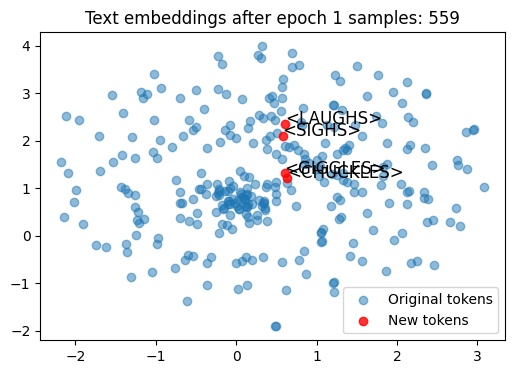

Epoch 2/2: 100%|███████████████████████████████████| 559/559 [00:43<00:00, 12.91samples/s, grad_norm=0.08, loss=3.0932]


Checkpoint of text_embedding and text_head saved to finetune_models\checkpoints\text_2.pt


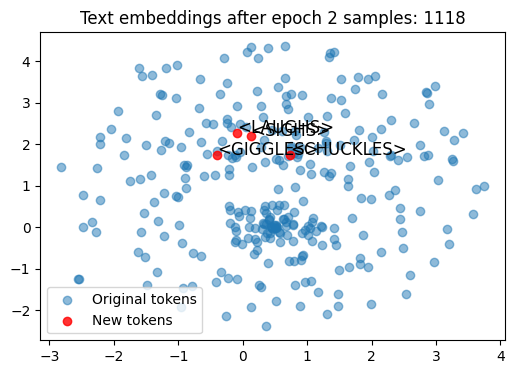

Training new text embeddings and text head completed.


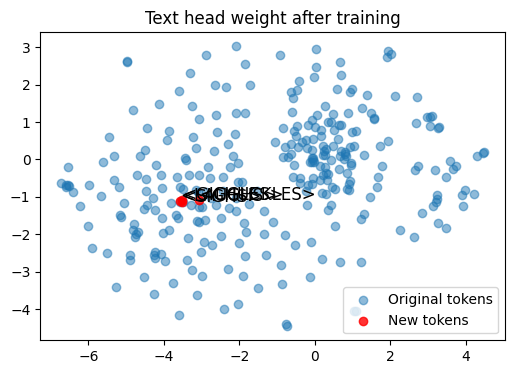

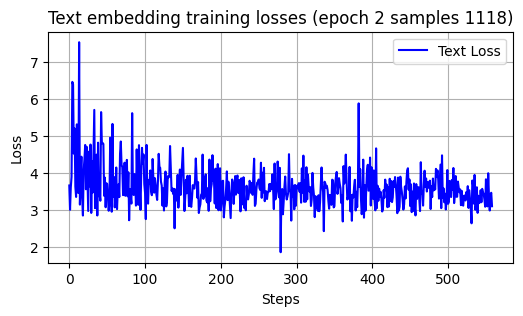

In [22]:
TEXT_EMB_EPOCHS = 2
BATCH_SIZE = 1  # always 1 here
GRAD_ACCUMULATION_STEPS = 2  # accumulate gradients for 2 steps
WEIGHT_DECAY = 0.1  # weight decay for the new tokens training
MAX_GRAD_NORM = 3.0  # max gradient norm for clipping
LEARNING_RATE = 1e-4  # learning rate for the new tokens training
seed = 42
torch.manual_seed(seed)
log_path = os.path.join(save_checkpoint_dir, "train_text_emb_log.txt")
print(f"Training log will be saved to: {log_path}")
log_file = open(log_path, "w", encoding="utf-8")

log_message("epochs: " + str(TEXT_EMB_EPOCHS), log_file)
log_message("batch size: " + str(BATCH_SIZE), log_file)

total_samples_per_epoch = len(processed_ds) // TEXT_EMB_EPOCHS
total_update_steps = total_samples_per_epoch // (BATCH_SIZE * GRAD_ACCUMULATION_STEPS)
new_token_loss_initial_weight = 5.0
optimizer = NewTokensTrainingOptimizer(model, new_token_ids, lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
optimizer.zero_grad()
display_trainable_params(model)
proc_seq_count = 0
text_losses = []
batched_loss = None
for epoch in range(TEXT_EMB_EPOCHS):
    log_message(f"EPOCH {epoch} started" + "=" * 30, log_file)
    new_token_weight = max(1.2, new_token_loss_initial_weight * (1.0 - epoch / TEXT_EMB_EPOCHS))
    acc_loss = torch.tensor(0, device=device, dtype=torch.float32)
    with tqdm(
        range(total_samples_per_epoch * epoch, total_samples_per_epoch * (epoch + 1)),
        desc=f"Epoch {epoch + 1}/{TEXT_EMB_EPOCHS}",
        unit="samples",
    ) as progress:
        for idx in progress:
            mels, mel_codes, text_ids = as_torch_tensor(processed_ds[idx], device=device)
            outputs = train_UnifiedVoice(
                model,
                mels,
                mel_codes[:, :5], # limit to 5 tokens, since we are training text embeddings and text head
                text_ids,
                add_mel_stop_token=False,  # uncompeleted mel codes
                output_loss=False,
                output_logits=True,
            )
            text_logits = outputs["logits"][0]
            text_targets = outputs["targets"][0]
            # calculate the loss for new tokens
            loss_text = F.cross_entropy(text_logits, text_targets, reduction="none")
            new_token_mask = torch.isin(text_targets, new_token_ids)
            weight_mask = torch.ones_like(text_targets, dtype=torch.float32, device=device)
            weight_mask[new_token_mask] = new_token_weight
            weighted_loss = (loss_text * weight_mask.view(-1)).mean()
            if torch.isnan(weighted_loss):
                continue  # skip NaN losses
            proc_seq_count += 1
            weighted_loss /= BATCH_SIZE * GRAD_ACCUMULATION_STEPS
            weighted_loss.backward()
            acc_loss += weighted_loss.detach()
            if proc_seq_count % (BATCH_SIZE * GRAD_ACCUMULATION_STEPS) == 0:
                text_losses.append(acc_loss.item())
                grad_norm = torch.nn.utils.clip_grad_norm_(
                    model.parameters(),
                    max_norm=MAX_GRAD_NORM,
                )
                loss_str = f"{acc_loss.item():.4f}"
                progress.set_postfix(loss=loss_str, grad_norm=f"{grad_norm.item():.2f}")
                optimizer.step()
                optimizer.zero_grad()
                log_message(f"loss: {loss_str}, epoch: {epoch}, samples: {proc_seq_count}", log_file)
                acc_loss.zero_()
            del (
                outputs,
                mel_codes,
                text_ids,
                loss_text,
                weighted_loss,
                text_logits,
                text_targets,
                new_token_mask,
                weight_mask,
            )
            if device.type == "cuda":
                torch.cuda.empty_cache()
    checkpoint_path = os.path.join(save_checkpoint_dir, f"text_{epoch + 1}.pt")
    optimizer.save_checkpoint(checkpoint_path)
    if device.type == "cuda":
        torch.cuda.empty_cache()
    print(f"Checkpoint of text_embedding and text_head saved to {checkpoint_path}")
    visualize_text_embeddings(
        model.text_embedding, title=f"Text embeddings after epoch {epoch + 1} samples: {proc_seq_count}"
    )
log_file.close()
print("Training new text embeddings and text head completed.")
visualize_text_embeddings(model.text_head, title="Text head weight after training")
plot_ft_losses(text_losses, title=f"Text embedding training losses (epoch {TEXT_EMB_EPOCHS} samples {proc_seq_count})")
optimizer.zero_grad()
del optimizer

In [23]:
# set to True to reload the UnifiedVoice model
if False:
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    gpt_checkpoint_path = os.path.join(finetune_model_dir, config.gpt_checkpoint)
    with torch.no_grad():
        if "model" in globals():
            del model
        model = load_UnifiedVoice(config.gpt, gpt_checkpoint_path, device=device)
        # merge the new text embedding and text head weights
        last_text_checkpoint = os.path.join(save_checkpoint_dir, f"text_{TEXT_EMB_EPOCHS}.pt")
        text_state_dict = torch.load(last_text_checkpoint, map_location=device, weights_only=True)
        model.text_embedding.weight.copy_(text_state_dict["text_embedding.weight"])
        model.text_head.weight.copy_(text_state_dict["text_head.weight"])
        model.text_head.bias.copy_(text_state_dict["text_head.bias"])
        if "text_pos_embedding.emb.weight" in text_state_dict:
            model.text_pos_embedding.emb.weight.copy_(text_state_dict["text_pos_embedding.emb.weight"])
    del text_state_dict
    print(f"Text embedding and text head weights loaded from {last_text_checkpoint}")

In [24]:
clear_torch_cache(device)

Clearing CUDA cache...
3024.0 MiB reserved
CUDA cache cleared.
2964.0 MiB reserved


In [25]:
print("Testing synthetic speech after training text embeddings and text head.")
test_synthetic_speech(model, new_bpe_model, bigvgan, test_condition, device)

Testing synthetic speech after training text embeddings and text head.
Conditional Audio length: 5.90seconds


Text: Hey there my name is Elise, <GIGGLES> and I'm a speech generation model that can sound like a person.


--------------------
Text: 你 好 , 我 是 ELISE, 一 个 语 音 生 成 模 型 , <GIGGLES> 我 的 声 音 听 起 来 跟 真 人 一 样 .


--------------------


Finetune UnifiedVoice on the augmented dataset.

In [26]:
# fine-tune the inference model with LoRA
#%pip install peft --quiet
def get_lora_model(
    model: UnifiedVoice, new_token_ids=[], adapter_name="new_tokens", r=16, lora_alpha=32, lora_dropout=0.1
):
    from peft import get_peft_model, LoraConfig, TaskType

    gpt_lora_config = LoraConfig(
        r=r,
        target_modules=["attn.c_attn", "attn.c_proj", "mlp.c_fc", "mlp.c_proj"],
        # target_modules=["attn.c_attn", "attn.c_proj"], # training only the attention layers
        task_type=TaskType.CAUSAL_LM,
        lora_alpha=lora_alpha,
        lora_dropout=lora_dropout,
        bias="none",
    )
    model.requires_grad_(False)
    model.inference_model = get_peft_model(model.inference_model, gpt_lora_config, adapter_name=adapter_name)
    new_token_ids = torch.tensor(new_token_ids, device=model.text_embedding.weight.device, dtype=torch.long)
    if isinstance(model.text_embedding, NewTokensTrainableAdapter):
        # if the text embedding is already wrapped, we can use it directly
        model.text_embedding.new_token_ids = new_token_ids
        model.text_embedding.unmerge()
        model.text_embedding.requires_grad_(True)
    else:
        model.text_embedding = NewTokensTrainableAdapter(model.text_embedding, new_token_ids)
    
    if isinstance(model.text_head, NewTokensTrainableAdapter):
        model.text_head.new_token_ids = new_token_ids
        model.text_head.unmerge()
        model.text_head.requires_grad_(True)
    else:
        model.text_head = NewTokensTrainableAdapter(model.text_head, new_token_ids)
    return model

def freeze_text_embedding(model: UnifiedVoice):
    model.text_head.requires_grad_(False)
    model.text_embedding.requires_grad_(False)
    return model

@torch.no_grad()
def merge_lora_weights(model: UnifiedVoice, unload=False):
    model.text_embedding.merge()
    model.text_head.merge()
    if unload:
        model.inference_model = model.inference_model.merge_and_unload()
        model.text_embedding = model.text_embedding.base_layer
        model.text_head = model.text_head.base_layer
    else:
        model.inference_model.merge_adapter()
    print("Merged LoRA weights into the model.")
    return model


@torch.no_grad()
def unmerge_lora_weights(model: UnifiedVoice):
    model.inference_model.unmerge_adapter()
    model.text_embedding.unmerge()
    model.text_head.unmerge()
    print("Unmerged LoRA adapters")
    return model


def save_checkpoint(model: UnifiedVoice, checkpoint_path, merge_lora=True, unload_after_merge=False):
    """Save the model checkpoint."""
    from collections import OrderedDict

    checkpoint_state_dict = OrderedDict()
    model.eval()
    if merge_lora:
        model = merge_lora_weights(model, unload=unload_after_merge)
    state_dict = model.state_dict()
    for key, value in state_dict.items():
        if not key.startswith(("gpt.wte", "inference_model.")) and "new_tokens" not in key:
            checkpoint_state_dict[key] = value
    torch.save(checkpoint_state_dict, checkpoint_path)
    model.train()
    if merge_lora and not unload_after_merge:
        unmerge_lora_weights(model)
    del checkpoint_state_dict, state_dict
    print(f"UnifiedVoice checkpoint saved to: {checkpoint_path}")
    return checkpoint_path

In [27]:
model = get_lora_model(
    model,
    new_token_ids=list(config.dataset.additional_special_tokens.values()),
    adapter_name="new_tokens",
    r=16,
    lora_alpha=32,
    lora_dropout=0.1,
)
display_trainable_params(model)

Trainable parameters in the model:


D:\jupyter-lab\.venv\Lib\site-packages\peft\tuners\lora\layer.py:1768: UserWarning: fan_in_fan_out is set to False but the target module is `Conv1D`. Setting fan_in_fan_out to True.
  warnings.warn(


,name,shape,dtype,params
0,text_embedding.new_tokens_weight,"(4, 1280)",torch.float32,5120
1,gpt.h.0.attn.c_attn.lora_A.new_tokens.weight,"(16, 1280)",torch.float32,20480
2,gpt.h.0.attn.c_attn.lora_B.new_tokens.weight,"(3840, 16)",torch.float32,61440
3,gpt.h.0.attn.c_proj.lora_A.new_tokens.weight,"(16, 1280)",torch.float32,20480
4,gpt.h.0.attn.c_proj.lora_B.new_tokens.weight,"(1280, 16)",torch.float32,20480
...,...,...,...,...
190,gpt.h.23.mlp.c_fc.lora_B.new_tokens.weight,"(5120, 16)",torch.float32,81920
191,gpt.h.23.mlp.c_proj.lora_A.new_tokens.weight,"(16, 5120)",torch.float32,81920
192,gpt.h.23.mlp.c_proj.lora_B.new_tokens.weight,"(1280, 16)",torch.float32,20480
193,text_head.new_tokens_weight,"(4, 1280)",torch.float32,5120


Epoch 1/2: 100%|███████████████████████| 600/600 [01:24<00:00,  7.10samples/s, grad_norm=1.29, mel=4.8156, text=2.3914]


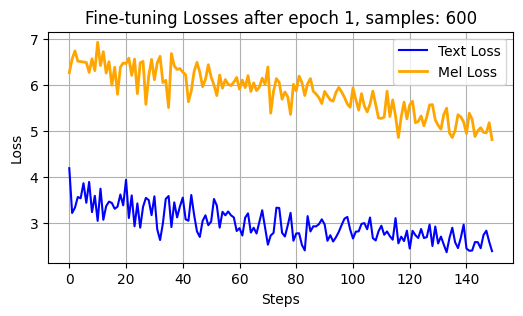

Validation epoch 1: 100%|███████████████| 293/293 [00:16<00:00, 17.99samples/s, acc_10=47.19, acc_20=59.55, mel=4.1696]


Clearing CUDA cache...
3066.0 MiB reserved
CUDA cache cleared.
3066.0 MiB reserved


**Validation results at epoch 1**

Text Loss: 2.5368, Mel Loss: 4.9297,Accuracy@1: 10.49, Accuracy@10: 37.08, Accuracy@20: 48.59

**Test results at epoch 1**



Conditional Audio length: 7.35seconds


Text: Hey there my name is Elise, <GIGGLES> and I'm a speech generation model that can sound like a person.


--------------------
Text: 你 好 , 我 是 ELISE, 一 个 语 音 生 成 模 型 , <GIGGLES> 我 的 声 音 听 起 来 跟 真 人 一 样 .


--------------------
Conditional Audio length: 8.35seconds


Text: Hey there my name is Elise, <GIGGLES> and I'm a speech generation model that can sound like a person.


--------------------
Text: 你 好 , 我 是 ELISE, 一 个 语 音 生 成 模 型 , <GIGGLES> 我 的 声 音 听 起 来 跟 真 人 一 样 .


--------------------
Merged LoRA weights into the model.
Unmerged LoRA adapters
UnifiedVoice checkpoint saved to: finetune_models\checkpoints\gpt_0.pth
new config saved to finetune_models\config_0.yaml


Epoch 2/2: 100%|███████████████████████| 600/600 [01:24<00:00,  7.09samples/s, grad_norm=1.69, mel=4.7912, text=2.7245]


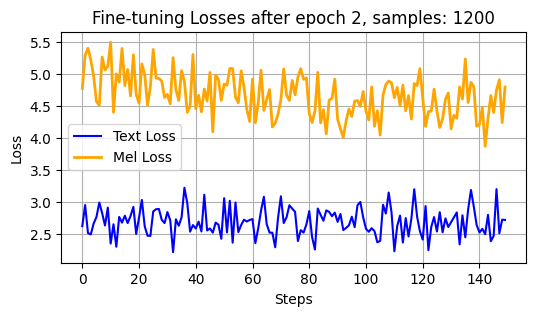

Validation epoch 2: 100%|███████████████| 293/293 [00:16<00:00, 17.99samples/s, acc_10=75.28, acc_20=85.39, mel=3.1259]


Clearing CUDA cache...
3064.0 MiB reserved
CUDA cache cleared.
3064.0 MiB reserved


**Validation results at epoch 2**

Text Loss: 2.5372, Mel Loss: 4.2223,Accuracy@1: 16.26, Accuracy@10: 50.32, Accuracy@20: 62.39

**Test results at epoch 2**



Conditional Audio length: 8.35seconds


Text: Hey there my name is Elise, <GIGGLES> and I'm a speech generation model that can sound like a person.


--------------------
Text: 你 好 , 我 是 ELISE, 一 个 语 音 生 成 模 型 , <GIGGLES> 我 的 声 音 听 起 来 跟 真 人 一 样 .


--------------------
Conditional Audio length: 6.25seconds


Text: Hey there my name is Elise, <GIGGLES> and I'm a speech generation model that can sound like a person.


--------------------
Text: 你 好 , 我 是 ELISE, 一 个 语 音 生 成 模 型 , <GIGGLES> 我 的 声 音 听 起 来 跟 真 人 一 样 .


--------------------
Merged LoRA weights into the model.
Unmerged LoRA adapters
UnifiedVoice checkpoint saved to: finetune_models\checkpoints\gpt_1.pth
new config saved to finetune_models\config_1.yaml
Merged LoRA weights into the model.
UnifiedVoice checkpoint saved to: finetune_models\gpt_finetuned.pth
Final config saved to finetune_models\config_finetuned.yaml
Finetuning UnifiedVoice completed. total steps: 300
Best validation loss at epoch 2: text_loss: 2.5372, mel_loss: 4.2223


In [28]:
from torch.optim import AdamW
from transformers import get_cosine_schedule_with_warmup
from peft.optimizers import create_loraplus_optimizer
import random

EPOCHS = 2
BATCH_SIZE = 1  # always 1 here
GRADIENT_ACCUMULATION_STEPS = 4
MAX_GRAD_NORM = 1.0
WEIGHT_DECAY = 0.01 # weight decay for AdamW 
LEARNING_RATE = 2e-5
EARLY_STOPPING_PATIENCE = 1  # early stopping patience for validation loss
MAX_STEPS_PER_EPOCH = 150  # max steps per epoch
seed = 91
random.seed(seed)
torch.manual_seed(seed)
total_ds_count = len(train_augment_ds)
total_samples_per_epoch = min(
    total_ds_count // EPOCHS, MAX_STEPS_PER_EPOCH * (BATCH_SIZE * GRADIENT_ACCUMULATION_STEPS)
)
total_update_steps = total_samples_per_epoch * EPOCHS // (BATCH_SIZE * GRADIENT_ACCUMULATION_STEPS)

# Efficient Low Rank Adaptation of Large Models: https://arxiv.org/abs/2402.12354
optimizer = create_loraplus_optimizer(
    model=model,
    optimizer_cls=AdamW,
    lr=LEARNING_RATE,
    loraplus_lr_ratio=8,  # lr ratio for lora_B weights
    loraplus_weight_decay=WEIGHT_DECAY,
    # loraplus_lr_embedding=2e-5, # not used, since we are training text embedding with NewTokensTrainableAdapter
)

scheduler = get_cosine_schedule_with_warmup(
    optimizer,
    num_warmup_steps=total_update_steps * 0.1, # 10% of total steps for warmup
    num_training_steps=total_update_steps,
)

log_path = os.path.join(save_checkpoint_dir, "train_UnifiedVoice_log.txt")
log_file = open(log_path, "w", encoding="utf-8")

optimizer.zero_grad()

ft_loss_results = defaultdict(list)
best_val_loss = (-1, 100.0, 100.0)  # (epoch, text_loss, mel_loss)
proc_seq_count = 0
acc_loss = torch.tensor([0.0, 0.0], device=device, dtype=torch.float32)
TEXT_ININ_WEIGHT = 0.3
MAX_TEXT_STEPS = total_update_steps // EPOCHS  # only train text embedding for the first epoch
text_weight = TEXT_ININ_WEIGHT
update_steps = 0

for epoch in range(EPOCHS):
    log_message(f"EPOCH {epoch} started" + "=" * 30, log_file=log_file)
    with tqdm(
        range(total_samples_per_epoch * epoch, total_samples_per_epoch * (epoch + 1)),
        desc=f"Epoch {epoch + 1}/{EPOCHS}",
        unit="samples",
        dynamic_ncols=True,
    ) as progress:
        for idx in progress:
            outputs = train_UnifiedVoice(model, *as_torch_tensor(train_augment_ds[idx], device=device))
            loss_text, loss_mel = outputs["loss"]
            weighted_loss = text_weight * loss_text + (1.0 - text_weight) * loss_mel
            if torch.isnan(weighted_loss) or torch.isinf(weighted_loss):
                log_message(
                    f"NaN or Inf loss encountered at epoch {epoch}, sample {idx}. Skipping this sample.",
                    log_file=log_file,
                )
                continue
            proc_seq_count += 1
            weighted_loss /= BATCH_SIZE * GRADIENT_ACCUMULATION_STEPS
            weighted_loss.backward()
            acc_loss[0] += loss_text.detach()
            acc_loss[1] += loss_mel.detach()
            if proc_seq_count % (BATCH_SIZE * GRADIENT_ACCUMULATION_STEPS) == 0:
                acc_loss /= BATCH_SIZE * GRADIENT_ACCUMULATION_STEPS
                grad_norm = torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=MAX_GRAD_NORM)
                optimizer.step()
                scheduler.step()
                optimizer.zero_grad()
                update_steps += 1
                loss_str = f"{(text_weight * acc_loss[0] + (1.0 - text_weight) * acc_loss[1]).item():.4f}"
                loss_text_str = f"{acc_loss[0].item():.4f}"
                loss_mel_str = f"{acc_loss[1].item():.4f}"
                log_message(
                    f"loss: {loss_str}, text_loss: {loss_text_str}, mel_loss: {loss_mel_str}, "
                    f"grad_norm: {grad_norm.item():.4f}, "
                    f"epoch: {epoch}, samples: {idx + 1}",
                    log_file=log_file,
                )
                ft_loss_results[epoch].append((acc_loss[0].item(), acc_loss[1].item()))
                progress.set_postfix(text=loss_text_str, mel=loss_mel_str, grad_norm=f"{grad_norm.item():.2f}")
                acc_loss.zero_()
                # update text_weight by update steps
                if update_steps < MAX_TEXT_STEPS - 1:
                    text_weight = max(TEXT_ININ_WEIGHT * (1.0 - update_steps / MAX_TEXT_STEPS), 0.01)
                # elif update_steps == MAX_TEXT_STEPS:
                #     freeze_text_embedding(model)
                #     text_weight = 0.0 # ignore text embedding loss after this step
            del (
                outputs,
                loss_text,
                loss_mel,
            )
            if device.type == "cuda":
                torch.cuda.empty_cache()
    log_message(f"End of epoch {epoch + 1}. Saving checkpoint...", log_file=log_file)
    
    if device.type == "cuda":
        torch.cuda.empty_cache()
    plot_ft_losses(
        [loss[0] for loss in ft_loss_results[epoch]],
        [loss[1] for loss in ft_loss_results[epoch]],
        title=f"Fine-tuning Losses after epoch {epoch + 1}, samples: {idx + 1}",
        xlabel="Steps",
    )
    # validate
    log_message(f"Validating epoch {epoch + 1}...", log_file=log_file)
    val_loss_text, val_loss_mel, val_acc_1, val_acc_10, val_acc_20 = validate_UnifiedVoice(
        model, valid_ds, device=device, epoch=epoch
    )
    # check early stopping condition
    need_early_stop = (
        epoch > 0 and best_val_loss[2] <= val_loss_mel and epoch - best_val_loss[0] >= EARLY_STOPPING_PATIENCE
    )
    best_val_loss = (
        (
            epoch,
            val_loss_text,
            val_loss_mel,
        )
        if best_val_loss[2] > val_loss_mel
        else best_val_loss
    )
    log_message(
        f"Validation results at epoch {epoch + 1}: "
        f"text_loss: {val_loss_text:.4f}, mel_loss: {val_loss_mel:.4f}, "
        f"acc@1: {val_acc_1:.2f}, acc@10: {val_acc_10:.2f}, acc@20: {val_acc_20:.2f}",
        log_file=log_file,
    )
    from IPython.display import Markdown, display

    display(
        Markdown(
            f"**Validation results at epoch {epoch + 1}**\n\n"
            f"Text Loss: {val_loss_text:.4f}, Mel Loss: {val_loss_mel:.4f},"
            f"Accuracy@1: {val_acc_1:.2f}, Accuracy@10: {val_acc_10:.2f}, Accuracy@20: {val_acc_20:.2f}"
        )
    )
    if device.type == "cuda":
        torch.cuda.empty_cache()
    # test synthetic speech after each epoch
    display(Markdown(f"**Test results at epoch {epoch + 1}**\n\n"))
    for i in random.sample(range(len(test_ds)), 2):
        t = test_ds[i]
        test_synthetic_speech(model, new_bpe_model, bigvgan, t, device, display_condition=True)
    # Store the model after each epoch to compare the performance of them
    checkpoint_path = os.path.join(save_checkpoint_dir, f"gpt_{epoch}.pth")
    save_checkpoint(model, checkpoint_path, unload_after_merge=False)
    new_config_path = os.path.join(finetune_model_dir, f"config_{epoch}.yaml")
    new_config = config.copy()
    new_config.gpt_checkpoint = os.path.relpath(checkpoint_path, finetune_model_dir)
    OmegaConf.save(new_config, new_config_path)
    print(f"new config saved to {new_config_path}")
    if need_early_stop:
        log_message(
            f"Early stopping at epoch {epoch + 1} due to validation loss not improving for {EARLY_STOPPING_PATIENCE} epochs.",
            log_file=log_file,
        )
        break
log_file.close()
final_checkpoint_path = os.path.join(finetune_model_dir, "gpt_finetuned.pth")
save_checkpoint(model, final_checkpoint_path, merge_lora=True, unload_after_merge=True)
new_config_path = os.path.join(finetune_model_dir, "config_finetuned.yaml")
new_config = config.copy()
new_config.gpt_checkpoint = "gpt_finetuned.pth"
OmegaConf.save(new_config, new_config_path)
print(f"Final config saved to {new_config_path}")
print("Finetuning UnifiedVoice completed.", "total steps:", update_steps)
print(
    f"Best validation loss at epoch {best_val_loss[0] + 1}: "
    f"text_loss: {best_val_loss[1]:.4f}, mel_loss: {best_val_loss[2]:.4f}"
)
del optimizer, scheduler

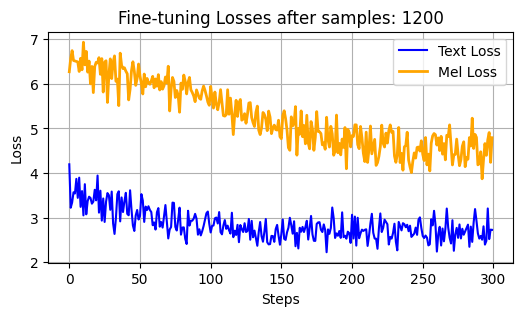

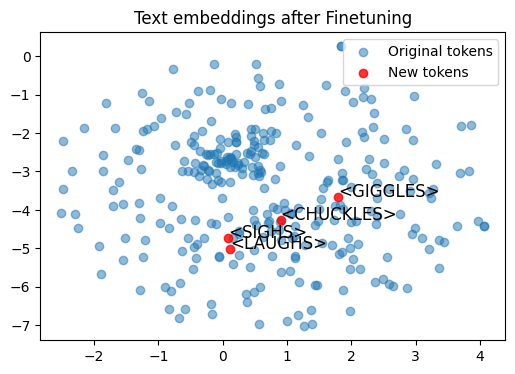

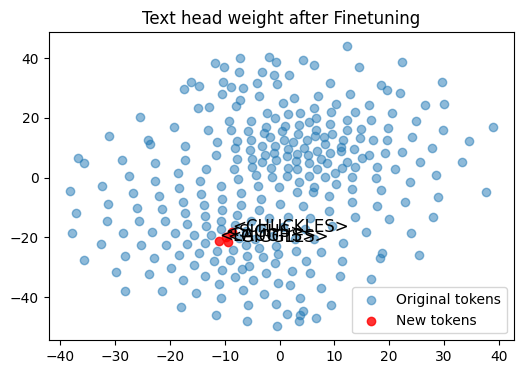

Clearing CUDA cache...
3124.0 MiB reserved
CUDA cache cleared.
2968.0 MiB reserved


In [29]:
plot_ft_losses(
    [loss[0] for losses in ft_loss_results.values() for loss in losses],
    [loss[1] for losses in ft_loss_results.values() for loss in losses],
    title=f"Fine-tuning Losses after samples: {idx + 1}",
    xlabel="Steps",
)
visualize_text_embeddings(
    model.text_embedding,
    title="Text embeddings after Finetuning",
)
visualize_text_embeddings(
    model.text_head,
    title="Text head weight after Finetuning",
)
clear_torch_cache(device)

Last Step: Use an un-seen conditioning audio to synthesize speech to evaluate generalization.

用一个不在微调数据集中的音频来合成语音，评估泛化性


In [30]:
from indextts.utils.feature_extractors import MelSpectrogramFeatures
from indextts.utils.common import load_audio
conditioning_audio_path = "index-tts/tests/sample_prompt.wav"
conditioning_audio = load_audio(conditioning_audio_path, 24000)
cond_mel = MelSpectrogramFeatures(**config.dataset.mel)(conditioning_audio)

test_synthetic_speech(
    model,
    new_bpe_model,
    bigvgan,
    {"mel": cond_mel, "text": "sample_prompt", "audio": {"array": conditioning_audio, "sampling_rate": np.array(24000)}},
    device,
)
del cond_mel, conditioning_audio

Conditional Audio length: 5.44seconds


Text: Hey there my name is Elise, <GIGGLES> and I'm a speech generation model that can sound like a person.


--------------------
Text: 你 好 , 我 是 ELISE, 一 个 语 音 生 成 模 型 , <GIGGLES> 我 的 声 音 听 起 来 跟 真 人 一 样 .


--------------------


虽然我们微调后，IndexTTS 可以用 `<giggles>` 标签生成笑声，但由于数据集过小，导致微调后模型**过拟合**，使用英文合成语音听起来跟预期的输入音色不太像了，反而与微调数据集`Elise`的音色非常接近。模型几乎遗忘了泛化能力，快变成了`Elise`专用版了。真实微调场景中，除非就需要生成特定人的声音，否则需要大量数据集来微调以保持模型的泛化性。你也可以尝试改动超参数（如学习率、max grad norm等）来改善模型的表现。

Although after fine-tuning, IndexTTS can generate laughter using the `<giggles>` tag, the model suffers from **overfitting** due to the small dataset size.
The synthesized English speech sounds less like the expected input voice and more like the voice of the fine-tuning dataset `Elise`. The model has almost forgotten its generalization ability and is becoming a dedicated version for `Elise`. Unless you specifically need to generate a particular person's voice, you would need a large dataset to fine-tune while maintaining the model's generalization capability. You can also try adjusting hyperparameters (such as learning rate, max grad norm, etc.) to improve the model's performance.

In [31]:
del model, new_bpe_model, bigvgan, config, train_augment_ds, valid_ds, test_ds, processed_ds
clear_torch_cache(device)

Clearing CUDA cache...
2968.0 MiB reserved
CUDA cache cleared.
2062.0 MiB reserved


## Speech synthesis via IndexTTS API

In [32]:
# mock TextNormalizer for getting rid of `TextNormalizer.load` error
from indextts.utils import front

original_load = front.TextNormalizer.load


def mock_load(self):
    if self.zh_normalizer is not None and self.en_normalizer is not None:
        return

    class MockNormalizer:
        def normalize(self, text):
            return text.upper()

    self.zh_normalizer = MockNormalizer()
    self.en_normalizer = MockNormalizer()


front.TextNormalizer.load = mock_load


In [33]:
import urllib.request
import os
audio_prompts = [
    {
        "id": "Female-1",
        "name": "Cyndi",
        "url": "https://bytedancespeech.github.io/seedtts_tech_report/audios/SpeechFactorization_samples/prompt/prompt1/4813840990459345930.wav",
        "lang": "en",
    },
    {
        "id": "Male-1",
        "name": "Michael",
        "url": "https://bytedancespeech.github.io/seedtts_tech_report/audios/SpeechFactorization_samples/source/2188769758301752050.wav",
        "lang": "en",
    },
]

prompts_dir = os.path.join("tests", "prompts")
os.makedirs(prompts_dir, exist_ok=True)

for audio_prompt in audio_prompts:
    audio_path = os.path.join(prompts_dir, f"{audio_prompt['id']}.wav")
    if not os.path.exists(audio_path):
        urllib.request.urlretrieve(
            audio_prompt["url"],
            audio_path,
        )

In [34]:
def to_safe_file_name(text: str):
    import re
    return re.sub(r"[,'\"?.<>:，。？！“’”‘&*#@~/\\\s]", "", text).strip()

In [35]:
welcome_texts = [
    r"Hey there my name is {name}, <giggles> and I'm a speech generation model that can sound like a person.",
    r"大家好，我是 {name}，一个语音生成模型，<giggles> 我的声音听起来跟真人一样。",
]
en_texts = [
    "Seriously? <giggles> That's the cutest thing I've ever heard!",
    "Oh, my gosh! <giggles> She called my name many times! <giggles> I— I’m so excited!",
    "Wha-? Cute? <giggles> You think I'm cute? Well, uh, thanks, I guess?",
]
zh_texts = [
    "真的吗？ <giggles> 这也太可爱了吧！",
    "我的天啊！<giggles> 她叫了好几次我的名字。<giggles> 我…我好兴奋啊！",
    "你说什么？可爱？<giggles> 你觉得我可爱？<giggles> 嗯…呃… 谢谢。",
]

In [36]:
import torch
import transformers
from IPython.display import Audio, display, Markdown
from indextts.infer import IndexTTS
seed = 42
transformers.set_seed(seed)
output_dir = os.path.join("tests", "output")
if os.path.exists(output_dir):
    import shutil

    shutil.rmtree(output_dir)
os.makedirs(output_dir, exist_ok=True)

all_texts = en_texts + zh_texts

finetune_model_dir = "finetune_models"
# change to the other epoch config if needed
# finetuned_config_path = os.path.join(finetune_model_dir, "config_0.yaml")
finetuned_config_path = os.path.join(finetune_model_dir, "config_finetuned.yaml")
tts = IndexTTS(
    cfg_path=new_config_path,
    model_dir=finetune_model_dir,
    use_cuda_kernel=False,
)
for audio_prompt in audio_prompts:
    audio_path = os.path.join(prompts_dir, f"{audio_prompt['id']}.wav")
    display(Markdown(f"**Audio Prompt**: {audio_prompt['id']} ({audio_prompt['lang']})"))
    display(Audio(filename=audio_path))
    for text in welcome_texts + all_texts:
        if r'{name}' in text:
            text = text.format(name=audio_prompt['name'])
        display(Markdown("**Text**: `{text}`".format(text=text)))
        file_name = to_safe_file_name(text[:40])
        output_path = os.path.join(output_dir, f"{audio_prompt['id']}_{file_name}.wav")
        tts.infer(
            audio_prompt=audio_path,
            text=text,
            verbose=False,
            do_sample=True,
            temperature=1.0,
            top_p=0.8,
            top_k=20,
            num_beams=3,
            output_path=output_path,
        )
        display(Audio(filename=output_path))
        torch.cuda.empty_cache()

>> GPT weights restored from: finetune_models\gpt_finetuned.pth
>> DeepSpeed加载失败，回退到标准推理: No module named 'deepspeed'
See more details https://www.deepspeed.ai/tutorials/advanced-install/
Removing weight norm...
>> bigvgan weights restored from: finetune_models\bigvgan_generator.pth
>> TextNormalizer loaded
>> bpe model loaded from: finetune_models\bpe_new.model


**Audio Prompt**: Female-1 (en)

**Text**: `Hey there my name is Cyndi, <giggles> and I'm a speech generation model that can sound like a person.`

>> start inference...
>> Reference audio length: 14.60 seconds
>> gpt_gen_time: 2.51 seconds
>> gpt_forward_time: 0.01 seconds
>> bigvgan_time: 0.14 seconds
>> Total inference time: 2.88 seconds
>> Generated audio length: 6.14 seconds
>> RTF: 0.4693
>> wav file saved to: tests\output\Female-1_HeytheremynameisCyndigigglesan.wav


**Text**: `大家好，我是 Cyndi，一个语音生成模型，<giggles> 我的声音听起来跟真人一样。`

>> start inference...
>> Reference audio length: 14.60 seconds
>> gpt_gen_time: 2.72 seconds
>> gpt_forward_time: 0.01 seconds
>> bigvgan_time: 0.10 seconds
>> Total inference time: 2.89 seconds
>> Generated audio length: 6.78 seconds
>> RTF: 0.4261
>> wav file saved to: tests\output\Female-1_大家好我是Cyndi一个语音生成模型giggles我的声音听起来跟.wav


**Text**: `Seriously? <giggles> That's the cutest thing I've ever heard!`

>> start inference...
>> Reference audio length: 14.60 seconds
>> gpt_gen_time: 1.68 seconds
>> gpt_forward_time: 0.01 seconds
>> bigvgan_time: 0.11 seconds
>> Total inference time: 1.81 seconds
>> Generated audio length: 4.10 seconds
>> RTF: 0.4428
>> wav file saved to: tests\output\Female-1_SeriouslygigglesThatsthecutestt.wav


**Text**: `Oh, my gosh! <giggles> She called my name many times! <giggles> I— I’m so excited!`

>> start inference...
>> Reference audio length: 14.60 seconds
>> gpt_gen_time: 2.59 seconds
>> gpt_forward_time: 0.01 seconds
>> bigvgan_time: 0.11 seconds
>> Total inference time: 2.75 seconds
>> Generated audio length: 6.31 seconds
>> RTF: 0.4358
>> wav file saved to: tests\output\Female-1_Ohmygosh!gigglesShecalledmynam.wav


**Text**: `Wha-? Cute? <giggles> You think I'm cute? Well, uh, thanks, I guess?`

>> start inference...
>> Reference audio length: 14.60 seconds
>> gpt_gen_time: 2.65 seconds
>> gpt_forward_time: 0.01 seconds
>> bigvgan_time: 0.11 seconds
>> Total inference time: 2.81 seconds
>> Generated audio length: 6.44 seconds
>> RTF: 0.4362
>> wav file saved to: tests\output\Female-1_Wha-CutegigglesYouthinkImcute.wav


**Text**: `真的吗？ <giggles> 这也太可爱了吧！`

>> start inference...
>> Reference audio length: 14.60 seconds
>> gpt_gen_time: 1.48 seconds
>> gpt_forward_time: 0.01 seconds
>> bigvgan_time: 0.11 seconds
>> Total inference time: 1.61 seconds
>> Generated audio length: 3.50 seconds
>> RTF: 0.4596
>> wav file saved to: tests\output\Female-1_真的吗giggles这也太可爱了吧.wav


**Text**: `我的天啊！<giggles> 她叫了好几次我的名字。<giggles> 我…我好兴奋啊！`

>> start inference...
>> Reference audio length: 14.60 seconds
>> gpt_gen_time: 2.18 seconds
>> gpt_forward_time: 0.01 seconds
>> bigvgan_time: 0.11 seconds
>> Total inference time: 2.32 seconds
>> Generated audio length: 5.38 seconds
>> RTF: 0.4319
>> wav file saved to: tests\output\Female-1_我的天啊giggles她叫了好几次我的名字giggles我…我好.wav


**Text**: `你说什么？可爱？<giggles> 你觉得我可爱？<giggles> 嗯…呃… 谢谢。`

>> start inference...
>> Reference audio length: 14.60 seconds
>> gpt_gen_time: 2.75 seconds
>> gpt_forward_time: 0.01 seconds
>> bigvgan_time: 0.11 seconds
>> Total inference time: 2.92 seconds
>> Generated audio length: 6.87 seconds
>> RTF: 0.4245
>> wav file saved to: tests\output\Female-1_你说什么可爱giggles你觉得我可爱giggles嗯…呃….wav


**Audio Prompt**: Male-1 (en)

**Text**: `Hey there my name is Michael, <giggles> and I'm a speech generation model that can sound like a person.`

>> start inference...
>> Reference audio length: 14.08 seconds
>> gpt_gen_time: 2.46 seconds
>> gpt_forward_time: 0.01 seconds
>> bigvgan_time: 0.04 seconds
>> Total inference time: 2.76 seconds
>> Generated audio length: 6.14 seconds
>> RTF: 0.4493
>> wav file saved to: tests\output\Male-1_HeytheremynameisMichaelgiggles.wav


**Text**: `大家好，我是 Michael，一个语音生成模型，<giggles> 我的声音听起来跟真人一样。`

>> start inference...
>> Reference audio length: 14.08 seconds
>> gpt_gen_time: 2.39 seconds
>> gpt_forward_time: 0.01 seconds
>> bigvgan_time: 0.11 seconds
>> Total inference time: 2.54 seconds
>> Generated audio length: 6.02 seconds
>> RTF: 0.4220
>> wav file saved to: tests\output\Male-1_大家好我是Michael一个语音生成模型giggles我的声音听起.wav


**Text**: `Seriously? <giggles> That's the cutest thing I've ever heard!`

>> start inference...
>> Reference audio length: 14.08 seconds
>> gpt_gen_time: 1.59 seconds
>> gpt_forward_time: 0.01 seconds
>> bigvgan_time: 0.11 seconds
>> Total inference time: 1.72 seconds
>> Generated audio length: 3.93 seconds
>> RTF: 0.4381
>> wav file saved to: tests\output\Male-1_SeriouslygigglesThatsthecutestt.wav


**Text**: `Oh, my gosh! <giggles> She called my name many times! <giggles> I— I’m so excited!`

>> start inference...
>> Reference audio length: 14.08 seconds
>> gpt_gen_time: 3.18 seconds
>> gpt_forward_time: 0.01 seconds
>> bigvgan_time: 0.11 seconds
>> Total inference time: 3.36 seconds
>> Generated audio length: 7.81 seconds
>> RTF: 0.4307
>> wav file saved to: tests\output\Male-1_Ohmygosh!gigglesShecalledmynam.wav


**Text**: `Wha-? Cute? <giggles> You think I'm cute? Well, uh, thanks, I guess?`

>> start inference...
>> Reference audio length: 14.08 seconds
>> gpt_gen_time: 2.64 seconds
>> gpt_forward_time: 0.01 seconds
>> bigvgan_time: 0.11 seconds
>> Total inference time: 2.81 seconds
>> Generated audio length: 6.57 seconds
>> RTF: 0.4271
>> wav file saved to: tests\output\Male-1_Wha-CutegigglesYouthinkImcute.wav


**Text**: `真的吗？ <giggles> 这也太可爱了吧！`

>> start inference...
>> Reference audio length: 14.08 seconds
>> gpt_gen_time: 1.61 seconds
>> gpt_forward_time: 0.01 seconds
>> bigvgan_time: 0.11 seconds
>> Total inference time: 1.74 seconds
>> Generated audio length: 3.84 seconds
>> RTF: 0.4526
>> wav file saved to: tests\output\Male-1_真的吗giggles这也太可爱了吧.wav


**Text**: `我的天啊！<giggles> 她叫了好几次我的名字。<giggles> 我…我好兴奋啊！`

>> start inference...
>> Reference audio length: 14.08 seconds
>> gpt_gen_time: 3.65 seconds
>> gpt_forward_time: 0.02 seconds
>> bigvgan_time: 0.11 seconds
>> Total inference time: 3.85 seconds
>> Generated audio length: 9.00 seconds
>> RTF: 0.4277
>> wav file saved to: tests\output\Male-1_我的天啊giggles她叫了好几次我的名字giggles我…我好.wav


**Text**: `你说什么？可爱？<giggles> 你觉得我可爱？<giggles> 嗯…呃… 谢谢。`

>> start inference...
>> Reference audio length: 14.08 seconds
>> gpt_gen_time: 3.35 seconds
>> gpt_forward_time: 0.01 seconds
>> bigvgan_time: 0.11 seconds
>> Total inference time: 3.54 seconds
>> Generated audio length: 8.45 seconds
>> RTF: 0.4186
>> wav file saved to: tests\output\Male-1_你说什么可爱giggles你觉得我可爱giggles嗯…呃….wav
